# LECTURE 9 - Pandas and Data Sourcing Recap

___

For this lesson, we use a dataset about [AirBnB](https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data)

NExt to [Kaggle](https://www.kaggle.com), Google also provides a place to search for data called [Google Dataset Search](https://datasetsearch.research.google.com)

---

## Ressources

- Automate the Boring Stuff with Python
- Andrew Ng [Machine Learning](https://www.coursera.org/learn/machine-learning?utm_source=gg&utm_medium=sem&utm_content=07-StanfordML-ROW&campaignid=2070742271&adgroupid=80109820241&device=c&keyword=machine%20learning%20mooc&matchtype=b&network=g&devicemodel=&adpostion=&creativeid=369041663186&hide_mobile_promo&gclid=EAIaIQobChMI-LXr3I6A6wIVEO7tCh0M1gNeEAAYASAAEgJrwvD_BwE)
- [Dataquest](https://www.dataquest.io)
- [Datacamp](https://www.datacamp.com)

In [2]:
# We need the request package for handling the API
%matplotlib inline
import numpy as np
import pandas as pd
import requests
import matplotlib
from matplotlib import pyplot as plt

# New plotting library
import seaborn as sns

# For the web scraping itself we use BeautifulSoup
from bs4 import BeautifulSoup

In [3]:
# Now let's import our data from the csv file and have a look at the shape
listings_df = pd.read_csv('AB_NYC_2019.csv')
listings_df.shape

(48895, 16)

In [4]:
# Now, we would like to get an idea about the columns
listings_df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [5]:
# The data types are also important
listings_df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [6]:
# And before we start, we also would like to see the statistical describtion of the data set
listings_df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [7]:
# Finally, we check out some of the entries
listings_df.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


---

## Making sure that data is clean

ALways the first thing we should do after the loading and description

In [8]:
# For example, we want to check if there are missing values
listings_df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

---

## Do we need all the columns?

For example: We see that approx. 20% of the listings do not have a last_review or reviews_per_month

In [9]:
# We see that approx. 20% of the listings do not have a last_review or reviews_per_month
columns_to_drop = ['host_name', 'last_review']

# So we drop the pre-specified columns inplace
listings_df.drop(columns_to_drop, axis='columns', inplace=True)

listings_df.head(10)

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,0.59,1,129
6,5121,BlissArtsSpace!,7356,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,1.33,4,188


---

## Cleaning `NaN` values

In [10]:
# Since we have some missing data in reviews_per_month, we need to change the NaN values to 0s
listings_df.fillna({'reviews_per_month': 0}, inplace=True)

listings_df.head(10)

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,0.59,1,129
6,5121,BlissArtsSpace!,7356,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,1.33,4,188


---

## Columns & Rows

In [11]:
# Creating subsets of the original dataframe
listings_df[['name', 'neighbourhood_group', 'price']]

,name,neighbourhood_group,price
0,Clean & quiet apt home by the park,Brooklyn,149
1,Skylit Midtown Castle,Manhattan,225
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,150
3,Cozy Entire Floor of Brownstone,Brooklyn,89
4,Entire Apt: Spacious Studio/Loft by central park,Manhattan,80
...,...,...,...
48890,Charming one bedroom - newly renovated rowhouse,Brooklyn,70
48891,Affordable room in Bushwick/East Williamsburg,Brooklyn,40
48892,Sunny Studio at Historical Neighborhood,Manhattan,115
48893,43rd St. Time Square-cozy single bed,Manhattan,55


In [12]:
# Selecting specific rows and columns
listings_df[['name', 'price']][2:4]

,name,price
2,THE VILLAGE OF HARLEM....NEW YORK !,150
3,Cozy Entire Floor of Brownstone,89


---

## Single Cell Read

In [13]:
# .at finds the corresponding value to a specific row index and column
listings_df.at[0, 'price']

149

In [14]:
# loc (localize) uses the rows and columns to also get a subset
listings_df.loc[0:3, ['price', 'name']]

,price,name
0,149,Clean & quiet apt home by the park
1,225,Skylit Midtown Castle
2,150,THE VILLAGE OF HARLEM....NEW YORK !
3,89,Cozy Entire Floor of Brownstone


---

## Boolean Indexing

Let's answer some example qestions

### What are the 10 most reviewed listings?

In [15]:
# nlargest selects the highest values
listings_df.nlargest(10, 'number_of_reviews')


,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,13.40,2,173
10623,8168619,Steps away from Laguardia airport,37312959,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,11.59,5,163
1879,834190,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,6.95,1,179
20403,16276632,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,16.22,5,341
4870,3474320,Private brownstone studio Brooklyn,12949460,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,8.14,1,269
471,166172,LG Private Room/Family Friendly,792159,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,6.70,1,0


### What are the NY neighbourhood groups with listings?

In [16]:
# This can be easily done with the unique function
listings_df['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

### How many listings per neighbourhood group?

In [17]:
# This function helps to group and count specific values
listings_df['neighbourhood_group'].value_counts()

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

### What are the top 10 neighbourhoods with AirBnB listings?

In [18]:
# Not regarding the rating but regarding the count of listings
listings_df['neighbourhood'].value_counts()

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
                      ... 
Woodrow                  1
Richmondtown             1
Rossville                1
Willowbrook              1
New Dorp                 1
Name: neighbourhood, Length: 221, dtype: int64

### Hosts with the most listings on AirBnB

In [19]:
# This result is actually frightening and I really hope it's a business and not a single person
listings_df['host_id'].value_counts().head(5)

219517861    327
107434423    232
30283594     121
137358866    103
12243051      96
Name: host_id, dtype: int64

---

## Data Visualization

<AxesSubplot:>

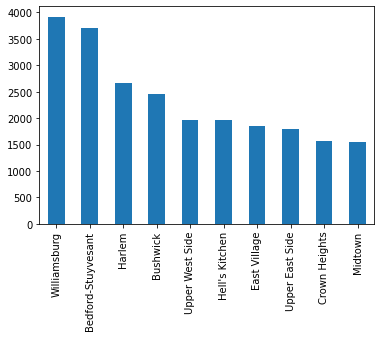

In [20]:
# Let's plot a bar chart for the amount of listings per neighbourhood
listings_df['neighbourhood'].value_counts().head(10).plot(kind='bar')

<AxesSubplot:>

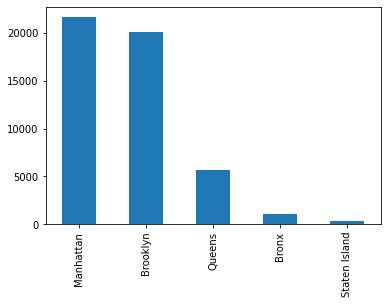

In [21]:
# Let's do the same for the larger neighbourhoods
listings_df['neighbourhood_group'].value_counts().head(10).plot(kind='bar')

---

## Plotting with [Seaborn](https://seaborn.pydata.org)

Not as extensive as matplotlib but it allows us to customize the graphs more detailed

<AxesSubplot:xlabel='neighbourhood_group', ylabel='count'>

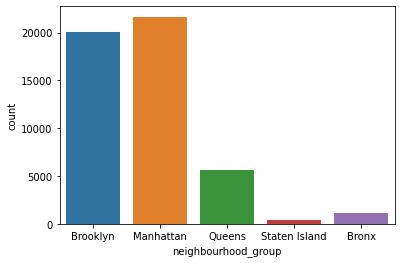

In [22]:
# The same plot with seaborn -> not ordered, colors, axis are labeled by default
sns.countplot(data=listings_df, x='neighbourhood_group')

In [23]:
# So let's try to order the bars by ordering the index
order = listings_df['neighbourhood_group'].value_counts().index
order

Index(['Manhattan', 'Brooklyn', 'Queens', 'Bronx', 'Staten Island'], dtype='object')

<AxesSubplot:xlabel='neighbourhood_group', ylabel='count'>

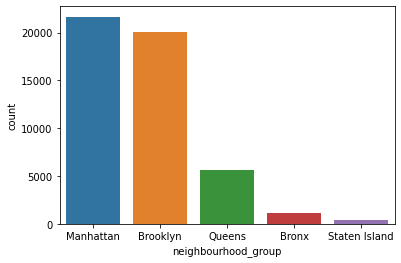

In [24]:
# Now we plot it again with the correct order parameter
sns.countplot(data=listings_df, x='neighbourhood_group', order=order)


### What's the influence of the neighbourhood group on a room type?

In [25]:
# Let's check out the different room types first
listings_df['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

<AxesSubplot:xlabel='room_type', ylabel='count'>

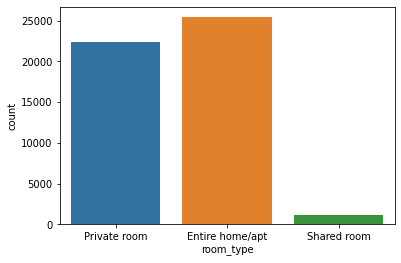

In [26]:
# First we plot just the counts of the different room types
sns.countplot(data=listings_df, x='room_type')

<AxesSubplot:xlabel='neighbourhood_group', ylabel='count'>

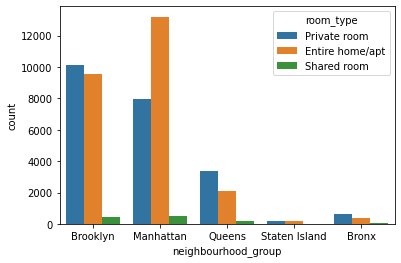

In [27]:
# Now we create a bar plot with hues where we have categories ased on the neighbourhood and hues expressing the room types in each neighbourhood
sns.countplot(data=listings_df, x='neighbourhood_group', hue='room_type')

---

## Distribution Plots

<AxesSubplot:xlabel='price'>

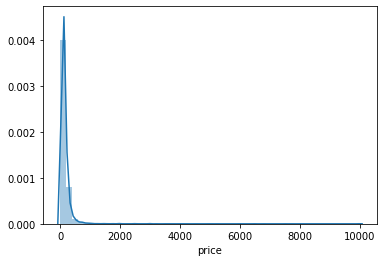

In [28]:
# ice thing to do when exploring data
sns.distplot(listings_df['price'])

<AxesSubplot:xlabel='price'>

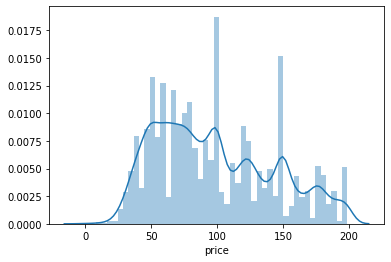

In [29]:
# Let's ust look at a specific price range
sns.distplot(listings_df[listings_df['price'] < 200]['price'])

### How many flats are more expensive than $500 per night? Could wew remove those outlieres from the visualization?

In [30]:
# More than $ 500 per night
cond_1 = listings_df['price'] >= 500
listings_df[cond_1].shape

(1235, 14)

<AxesSubplot:xlabel='price'>

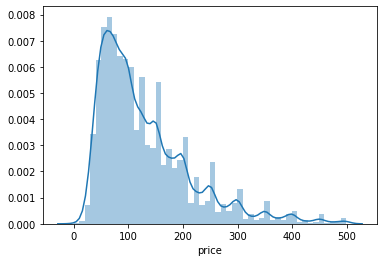

In [31]:
# Less than $500 per night
cond_2 = listings_df['price'] < 500
affordable_df = listings_df[cond_2]

# Let's plot the affordable flats
sns.distplot(affordable_df['price'])

In [32]:
# What is the mean of the affordable flats
affordable_df['price'].mean()

130.0539026437264

### What is the distribution of flat prices based on the neighbourhood?

<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

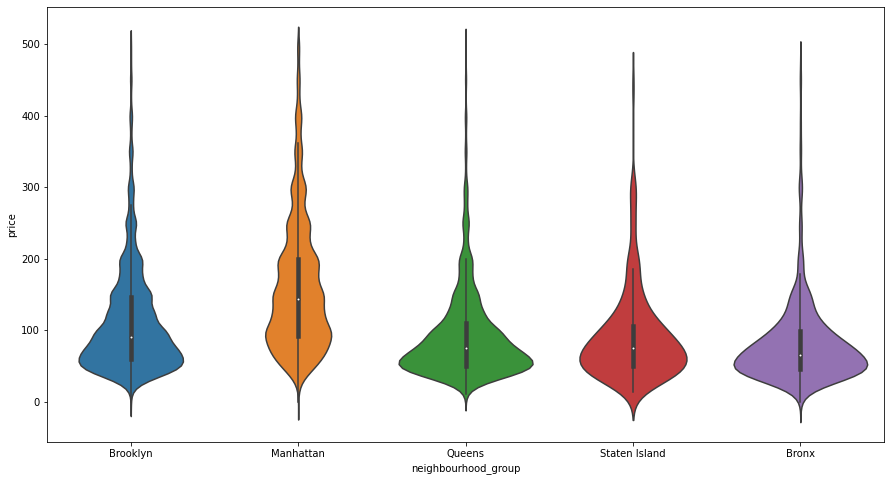

In [33]:
# Let's use a violin chart which shows the distributions and this time and also use pyplot to adjust the size
plt.figure(figsize=(15, 8))
sns.violinplot(data=affordable_df, x='neighbourhood_group', y='price')

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

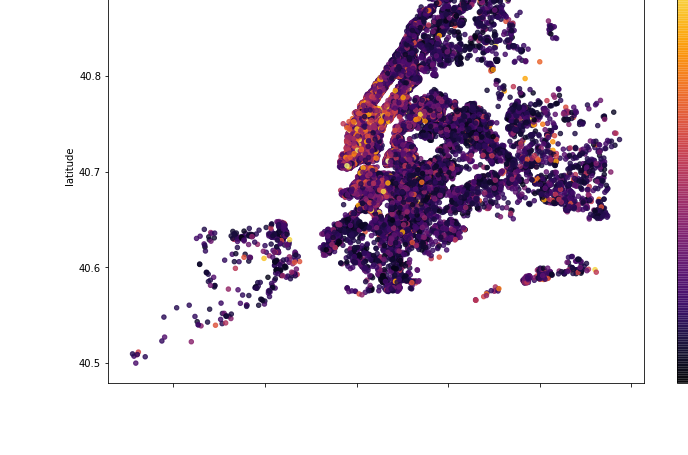

In [34]:
affordable_df.plot(
    kind='scatter',
    x='longitude',
    y='latitude',
    c='price',
    cmap='inferno',
    colorbar=True,
    alpha=0.8,
    figsize=(12, 8)
)

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

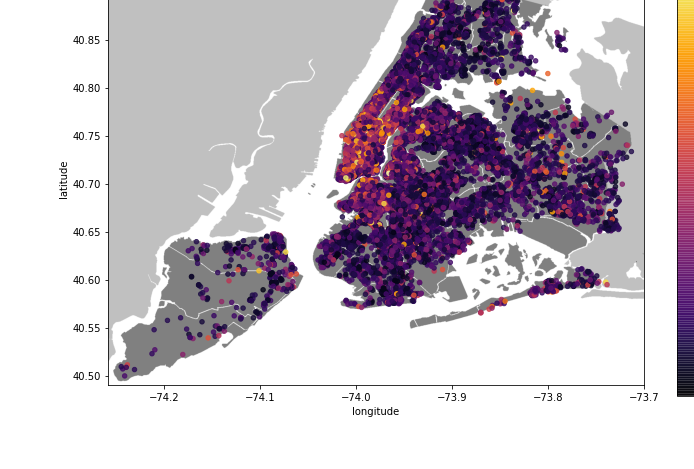

In [35]:
# To make it even better we can grab an image to exchange the background of the graph
plt.imshow(plt.imread('Neighbourhoods_New_York_City_Map.png'), zorder=0, extent=[-74.258, -73.7, 40.49, 40.92]) # plot with the right coordinates for our dataset

ax = plt.gca()
affordable_df.plot(
    ax=ax,
    zorder=1,
    kind='scatter',
    x='longitude',
    y='latitude',
    c='price',
    cmap='inferno',
    colorbar=True,
    alpha=0.8,
    figsize=(12,8)
)